This file is part of a program that is used to develop an objective way to
segment the fetus from ultrasound images, and to analyse the effectiveness of 
using the resulting mask to produce an unobstructed visualisation of the fetus.
The research is organised in three phases: (1) noise reduction filters, 
(2a) heuristic segmentation models, (2b) deep learning segmentation
approach (U-net), and (3) the volume visualisation. The program is developed
for the master Computational Science at the UvA from February to November 2020.

This file contains code for the deep learning segmentation approach (U-net). <br>
You can run this file to train and test the U-net network with ReLU activation functions and the smoothed images as an input. 

Made by Romy Meester


In [1]:
"""
Phase 2b: The deep learning segmentation approach (U-net).
- Input image: smoothed image 
- Activation function: ReLU
"""

import os
import numpy as np
import pydicom
import pickle
import SimpleITK as sitk
import random 
import time
from tqdm import tqdm
import matplotlib.pyplot as plt
from jupyterthemes import jtplot

In [2]:
jtplot.style(context='paper', fscale=1.6, ticks=True, grid=False)

In [3]:
# Constants
DATA_PATH = '../datasets/'
RESULTS_PATH = 'results_unet'
RESULTS_MODEL_PATH = os.path.join(RESULTS_PATH, 'results_unet_model') 
RESULTS_DATA_PATH = os.path.join(RESULTS_PATH, 'results_unet_data')
RESULTS_IMG_PATH = os.path.join(RESULTS_PATH, 'results_unet_img')
RESULTS_VIS_PATH = os.path.join(RESULTS_PATH, 'results_unet_visualisations')

In [4]:
def create_folder(PATH):
    """ Create a folder. """
    try:
        os.mkdir(PATH)
        print('Directory', PATH, 'created' )
    except FileExistsError:
        print('Directory', PATH, 'already exists' )

# create results folder
create_folder(RESULTS_PATH)
    
# create results folder for saving the weights of the model 
create_folder(RESULTS_MODEL_PATH)

# create results folder for saving the frames, metadata, and metrics of the model 
create_folder(RESULTS_DATA_PATH)

# create results folder for the images (slices)
create_folder(RESULTS_IMG_PATH)

# create results folder for the plot visualisations 
create_folder(RESULTS_VIS_PATH)

Directory results_unet already exists
Directory results_unet\results_unet_model already exists
Directory results_unet\results_unet_data already exists
Directory results_unet\results_unet_img already exists
Directory results_unet\results_unet_visualisations already exists


# Load US data

In [5]:
def load_scans_sitk(pathDicom):
    """ Load the dicom files into sitk with the image series reader.
    Input: path of the directory with the dicom files.
    Output: the 3D image.
    """
    reader = sitk.ImageSeriesReader()
    filenamesDICOM = reader.GetGDCMSeriesFileNames(pathDicom)
    reader.SetFileNames(filenamesDICOM)
    img = reader.Execute()
    return img

def get_data_sitk(rootdir, datasetnames):
    """ Generate the dataset which includes the cropped, original images and the 
    ground truth images of the datasets. The input is the root directory to the 
    folders with the corresponding dataset names. The output is a dictionary
    with all these images. 
    """
    datasets = {}

    print('Loading: ' + str(len(datasetnames)) + ' datasets')
    for dataset in tqdm(datasetnames):
        time.sleep(0.1)
        
        # generate the images 
        # Original images (to predict) and ground truth images (mask image of expert)
        images_org = load_scans_sitk(rootdir + dataset + '/crop_org/')
        images_gt = load_scans_sitk(rootdir + dataset + '/crop_gt/')

        # Save the images in datasets dictionary
        datasets.update({dataset : {'org': images_org, 'gt': images_gt}})

    print("datasets created")
    return datasets


In [6]:
folders = [f for f in os.listdir(DATA_PATH) if os.path.isdir(os.path.join(DATA_PATH, f))]
datasets = get_data_sitk(DATA_PATH, folders)

  0%|                                                                                            | 0/7 [00:00<?, ?it/s]

Loading: 7 datasets


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:08<00:00,  1.26s/it]

datasets created


# Image preprocessing

### Smoothing

In [7]:
def calc_anisodiff(img, iteration=5, step=0.05, conductance=1):
    """ The Gradient Anisotropic diffusion image filter. """
    # make the input image to a float64
    img_input = sitk.Cast(img,sitk.sitkFloat64)

    # apply filter
    blurFilter = sitk.GradientAnisotropicDiffusionImageFilter()
    blurFilter.SetNumberOfIterations(iteration)
    blurFilter.SetTimeStep(step)
    blurFilter.SetConductanceParameter(conductance)
    imgSmooth = blurFilter.Execute(img_input)
    return sitk.GetArrayFromImage(imgSmooth)


def smooth_images(datasets_smooth): 
    """ Smooth the images with the curvature flow. 
        Input: SITK arrays, output: numpy arrays. """
    
    # iterate over datasets dictionary
    for key, image in datasets_smooth.items():
        # smooth the original image 
        org_smooth = calc_anisodiff(img= image['org'], iteration=10, step=0.04, conductance=4)
        
        # make np arrays of ground truth
        try:
            org_gt = sitk.GetArrayFromImage(image['gt'])
        except:
            org_gt = np.array(0)
                   
        # save images 
        datasets_smooth[key] = {'org': org_smooth, 'gt': org_gt}

In [8]:
# copy dictionary datasets 
datasets_smooth = datasets.copy()

# remake the images from 3D to 2D slices
smooth_images(datasets_smooth)

### Generate images in all directions

In [9]:
def generate_2Dslices(images_frames, images_masks):
    """ Generate the 2D slices in 3 different directions. 
        Input = 3D images
        Output = 2D images"""
    
    #check the datashapes
    if (images_frames.shape != images_masks.shape) and (images_masks != np.array(0)):
        print('The shapes of frames and masks are not the same')
    
    results_frames = []
    results_masks = []
    
    #generate the datasets in 3 different directions 
    for index, shape_size in enumerate(images_frames.shape):
        if index == 0:
            for n in range(shape_size):
                image_frame = images_frames[n,:,:]
                try:
                    image_mask = images_masks[n,:,:]
                except:
                    image_mask = None
                results_frames.append(image_frame)
                results_masks.append(image_mask)
        if index == 1: 
            for n in range(shape_size):
                image_frame = images_frames[:,n,:]
                try:
                    image_mask = images_masks[:,n,:]
                except:
                    image_mask = None
                results_frames.append(image_frame)
                results_masks.append(image_mask)
        if index == 2: 
            for n in range(shape_size):
                image_frame = images_frames[:,:,n]
                try:
                    image_mask = images_masks[:,:,n]
                except: 
                    image_mask = None #np.array(0)
                results_frames.append(image_frame)
                results_masks.append(image_mask)            
 
    return np.array(results_frames), np.array(results_masks)

def generate_dataset2D(inputdatasets):
    """ From the 3D images, generate the 2D dataset inside the dictionary dataset. """
    
    # iterate over inputdataset dictionary 
    # and make from all 3D images, 2D slices in the values
    for key, image_3D in inputdatasets.items(): 
        image_2D_frames, image_2D_masks = generate_2Dslices(image_3D['org'], image_3D['gt'])
        inputdatasets[key] = {'org': image_2D_frames, 'gt': image_2D_masks}
    

In [10]:
# copy dictionary datasets 
inputdatasets = datasets_smooth.copy()

# remake the images from 3D to 2D slices
generate_dataset2D(inputdatasets)

### Add padding to the images

In [11]:
def calc_processable_sizes(size): 
    """ Calculate sizes which can be processed in the U-net divisible by 32. """
    new_size = np.ceil(size / 32) * 32
    return int(new_size)

def get_sizes(datasets):
    """ Get the highest width and height of the images. """
    max_width = 0
    max_height = 0
    
    # get the heighest width and height from all images
    for key, images in datasets.items(): 
        org_images = images['org']
        for image in org_images:   
            h, w = image.shape[:2]
            max_width = max(max_width, w)
            max_height = max(max_height, h)

    # get the (bigger) closest widht and height divisible by 32
    print('heighest width and height of images:', max_width, max_height)
    max_width = calc_processable_sizes(max_width)
    max_height = calc_processable_sizes(max_height)

    print('final (w,h)', max_width,max_height)
    return max_width, max_height

def pad(image, max_height, max_width):
    """ Pad the images with zeros. """
    
    h, w = image.shape[:2]
    diff_vert = max_height - h
    pad_top = diff_vert // 2
    pad_bottom = diff_vert - pad_top
    diff_hori = max_width - w
    pad_left = diff_hori // 2
    pad_right = diff_hori - pad_left

    return np.copy(np.pad(image, ((pad_top, pad_bottom), (pad_left, pad_right)), mode='constant', constant_values=0))

    
def add_padding(images, size): 
    """ Add the padding. """
    max_width = size[0] 
    max_height = size[1]
    
    new_images = []
    
    for image in images: 
        new_image = pad(image, max_height, max_width)
        new_images.append(new_image)
        
    return np.array(new_images)

def transform_images(datasets):
    """ Add padding to the datasets to make all images the same size. """

    # get the biggest sizes
    size = get_sizes(datasets)
    
    # create padding around the images 
    for key, images in datasets.items(): 
        org_images = images['org']
        gt_images = images['gt']
        
        new_org_images = add_padding(org_images, size)
        new_gt_images = add_padding(gt_images, size)
    
        # update dictionary 
        inputdatasetspadded[key] = {'org': new_org_images, 'gt': new_gt_images}
        
    return size
            
inputdatasetspadded = inputdatasets.copy()

img_width, img_height = transform_images(inputdatasetspadded)
print(img_width, img_height)

heighest width and height of images: 181 207
final (w,h) 192 224
192 224


(115, 141)


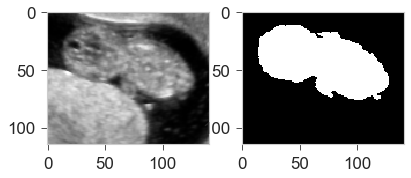

(224, 192)


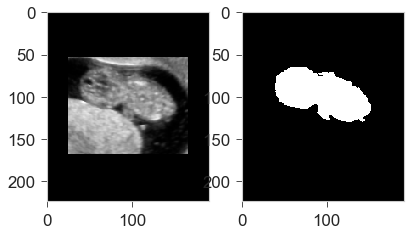

In [12]:
# check and show image shapes old to new
index = 70
print(inputdatasets['dataset1']['org'][0].shape)
fig, (ax1, ax2) = plt.subplots(1, 2)
ax1.imshow(inputdatasets['dataset1']['org'][index], cmap='gray')
ax2.imshow(inputdatasets['dataset1']['gt'][index], cmap='gray')
plt.show()

print(inputdatasetspadded['dataset1']['org'][0].shape)
fig, (ax1, ax2) = plt.subplots(1, 2)
ax1.imshow(inputdatasetspadded['dataset1']['org'][index], cmap='gray')
ax2.imshow(inputdatasetspadded['dataset1']['gt'][index], cmap='gray')
plt.show()

### Optional/extra: Make all images size 128x128 

In [13]:
import skimage
from skimage.transform import resize
from skimage import img_as_bool

output_shape = (128,128)

def resize_frames(images):
    """ Resize the original frames based on the output shape. """
    results = []
    for image in images:
        image = image.astype(np.uint8)
        result = skimage.transform.resize(image, output_shape)
        results.append(result)
    
    return np.array(results, dtype=np.float32)

def resize_masks(images): 
    """ Resize the mask frames based on the output shape. """
    results = []
    for image in images:
        image = image.astype(np.bool)
        result = img_as_bool(resize(image, output_shape))
        results.append(result)
    
    return np.array(results, dtype=np.bool)

def resize_images(inputdatasets):
    """ Reshape the 2D images to the desired shape. """
   
    # iterate over inputdataset dictionary 
    for key, images in inputdatasets.items(): 
        image_reshaped_frames =  resize_frames(images['org'])
        try: 
            if images['gt'][0] == None:
                image_reshaped_masks = None
        except: 
            image_reshaped_masks =  resize_masks(images['gt'])
       
        # save reshaped images 
        inputdatasets[key] = {'org': image_reshaped_frames, 'gt': image_reshaped_masks}

In [14]:
# copy dictionary datasets 
inputdatasets128 = inputdatasets.copy()

# remake the images from 3D to 2D slices
resize_images(inputdatasets128)


(115, 141)


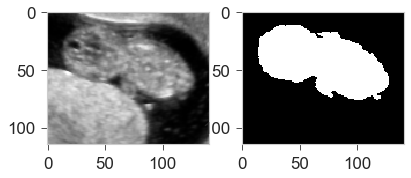

(128, 128)


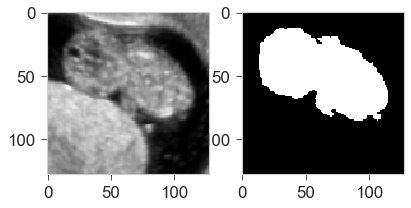

In [15]:
# check and show image shapes old to new
index = 70
print(inputdatasets['dataset1']['org'][0].shape)
fig, (ax1, ax2) = plt.subplots(1, 2)
ax1.imshow(inputdatasets['dataset1']['org'][index], cmap='gray')
ax2.imshow(inputdatasets['dataset1']['gt'][index], cmap='gray')
plt.show()

print(inputdatasets128['dataset1']['org'][0].shape)
fig, (ax1, ax2) = plt.subplots(1, 2)
ax1.imshow(inputdatasets128['dataset1']['org'][index], cmap='gray')
ax2.imshow(inputdatasets128['dataset1']['gt'][index], cmap='gray')
plt.show()


# Data preprocessing: make training and test datasets

In [16]:
# Fixed dataorder
def make_dataset(dataset, keylist, random_state):
    """ Make the dataset for either the trainingset or testset based on the keys of the datasets. """
    images_frames = []
    images_masks = []
    
    # make lists of frames and masks
    for key_index, images in dataset.items(): 
        if key_index in keylist: 
            for count, value in enumerate(images['org']):
                images_frames.append(value)
                try: 
                    images_masks.append(images['gt'][count])
                except: 
                    images_masks = None
    
    # shuffle the dataset
    try: 
        shuffling = list(zip(images_frames, images_masks))
        random.shuffle(shuffling)
        images_frames, images_masks = zip(*shuffling)
    except:
        random.shuffle(images_frames)
    
    return images_frames, images_masks


def check_groundtruth(dataset):
    """ Check the ground truth images and return the key datasets of dictionary. """
    keys_train = []
    keys_test = []
    
    for key, images in dataset.items(): 
        try: 
            if images['gt'] == None: 
                keys_test.append(key)
        except:
                keys_train.append(key)
        
    return keys_train, keys_test

def make_fixed_training_testset(dataset, test_size=0.30, random_state=42):
    """ This dataorder checks whether an dataset contains a ground truth. 
        When it does not, the dataset becomes a testset, when it does, the dataset becomes a trainingset. """
    
    # dataset keys for either training or testset
    keys_train, keys_test = check_groundtruth(dataset)
    
    # based on keys, generate training and test datasets
    train_frames, train_masks = make_dataset(dataset, keys_train, random_state)
    test_frames, test_masks = make_dataset(dataset, keys_test, random_state)
    
    print('Training datasets:', keys_train, 'contain', str(len(train_frames)), 'images')
    print('Testing datasets: ', keys_test, 'contain', str(len(test_frames)), 'images')
    print('Total images: ', str(len(train_frames) + len(test_frames)))
    metadata = {'Training datasets' : keys_training, 'Testing datasets' : keys_testing}
  
    return np.array(train_frames), np.array(test_frames), np.array(train_masks), np.array(test_masks), metadata
    

In [17]:
# Ordered dataorder
def define_datasizes(dataset, test_size): 
    """ Define the number of datasets used in the training and test dataset. """
    
    total_length = len(dataset) 
    nr_testing = round(total_length * test_size)
    nr_training = total_length - nr_testing 
    
    return nr_training, nr_testing

def make_ordered_training_testset(dataset, test_size, random_state):
    """ This dataorder randomly puts a whole dataset in the training or testset. """
    
    # define random state 
    random.seed(random_state)
    
    # define percentage of number of datasets used in training and testing 
    # and use this to generate the keys of training and testing datasets
    nr_training, nr_testing = define_datasizes(dataset, test_size)
    
    all_keys = list(dataset.keys())
    keys_training = random.sample(all_keys, nr_training)
    keys_testing = list(set(all_keys).symmetric_difference(keys_training))
    
    # based on keys, generate training and test datasets
    train_frames = []
    test_frames = []
    train_masks = []
    test_masks = []
    
    for key, images in dataset.items(): 
        # training images 
        if key in keys_training: 
            for count, value in enumerate(images['org']):
                train_frames.append(value)
                train_masks.append(images['gt'][count])
        
        # testing images 
        if key in keys_testing: 
            for count, value in enumerate(images['org']):
                test_frames.append(value)
                test_masks.append(images['gt'][count])
                
    # shuffle all images inside the frame lists 
    shuffle_train = list(zip(train_frames, train_masks))
    random.shuffle(shuffle_train)
    train_frames, train_masks = zip(*shuffle_train)
    
    shuffle_test = list(zip(test_frames, test_masks))
    random.shuffle(shuffle_test)
    test_frames, test_masks = zip(*shuffle_test)
        
    
    print('Training datasets:' , keys_training, 'contain', str(len(train_frames)), 'images')
    print('Testing datasets:', keys_testing, 'contain', str(len(test_frames)), 'images')
    print('Total images: ', str(len(train_frames) + len(test_frames)))
    metadata = {'Training datasets' : keys_training, 'Testing datasets' : keys_testing}
    
    return np.array(train_frames), np.array(test_frames), np.array(train_masks), np.array(test_masks), metadata

In [18]:
# Mixed dataorder
from sklearn.model_selection import train_test_split

def all_images(dataset):
    """ Return all the 2D slices. """
    images_frames = []
    images_masks = []
    
    # get all the 2D slices
    for key, images in dataset.items(): 
        for count, value in enumerate(images['org']):
            images_frames.append(images['org'][count])
            images_masks.append(images['gt'][count])
                
    return images_frames, images_masks
    
def make_mixed_training_testset(dataset, test_size=0.20, random_state=42):
    """ This dataorder takes all the images of all datasets and mixes these images 
    to put them either in the training or testset. """
    
    # Get all the images 
    all_frames, all_masks = all_images(dataset)

    # Split the images in a train and test dataset
    train_frames, test_frames, train_masks, test_masks = train_test_split(all_frames, all_masks, 
                                                                          test_size=test_size,random_state=random_state)
    
    print('Training dataset contain', str(len(train_frames)), 'images')
    print('Testing dataset contain', str(len(test_frames)), 'images')
    print('Total images: ', str(len(train_frames) + len(test_frames)))
    metadata = 'no metadata' #Training datasets' : keys_training, 'Testing datasets' : keys_testing}
    
    return np.array(train_frames), np.array(test_frames), np.array(train_masks), np.array(test_masks), metadata

In [19]:
def create_traintestframes(inputdataset, dataorder='ordered', test_size=0.30, random_state=42):
    """ Dependent on the dataorder, create the train and test frames. """
    print('Dataorder: ', dataorder)

    if dataorder == 'fixed':
        # The datasets with ground truth become training images, the datasets with no ground truth the test images. 
        # The train and test images are shuffled. 
        train_frames, test_frames, train_masks, test_masks, metadata = make_fixed_training_testset(inputdataset,
                                                                                                   test_size=0.30, random_state=random_state)

    if dataorder == 'ordered':
        # The images of each dataset are kept in the same dataset (either training or testing)
        train_frames, test_frames, train_masks, test_masks, metadata = make_ordered_training_testset(inputdataset, 
                                                                                                     test_size=0.30, random_state=random_state)

    if dataorder == 'mixed':
        # The images of each dataset are mixed (combined in training and testing)
        train_frames, test_frames, train_masks, test_masks, metadata = make_mixed_training_testset(inputdataset, 
                                                                                                   test_size=0.30, random_state=random_state)
    
    return train_frames, test_frames, train_masks, test_masks, metadata
    
    

In [20]:
# example 
train_frames, test_frames, train_masks, test_masks, metadata = create_traintestframes(inputdatasetspadded, dataorder='ordered', test_size=0.30, random_state=42)

Dataorder:  ordered
Training datasets: ['dataset6', 'dataset1', 'dataset7', 'dataset3', 'dataset5'] contain 2303 images
Testing datasets: ['dataset4', 'dataset2'] contain 735 images
Total images:  3038


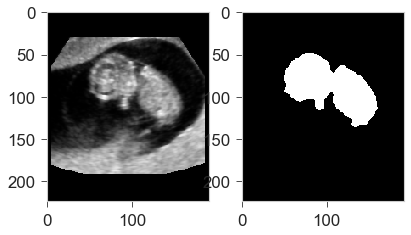

['dataset6', 'dataset1', 'dataset7', 'dataset3', 'dataset5']

In [21]:
# check
index = 100
fig, (ax1, ax2) = plt.subplots(1, 2)
ax1.imshow(train_frames[index], cmap='gray')
ax2.imshow(train_masks[index], cmap='gray')
plt.show()

metadata['Training datasets']

# Data generator: generate operable data for U-net

In [22]:
def reshape_data(data): 
    """ Reshaping the data to (x, y, z, 1). """
    data = np.reshape(data, (data.shape[0], data.shape[1], data.shape[2], 1))
    return data

def generator(images_frames, images_masks):   
    """ Generate operable data for Unet. """
    results_frames = reshape_data(images_frames)
    try:
        results_masks = reshape_data(images_masks)
    except: 
        results_masks = None

    return results_frames, results_masks


In [23]:
# example
X_train, Y_train = generator(train_frames, train_masks)
X_test, Y_test = generator(test_frames, test_masks)

print('Training data shape : ', X_train.shape, Y_train.shape)
print('Testing data shape : ', X_test.shape) #, Y_test.shape)

Training data shape :  (2303, 224, 192, 1) (2303, 224, 192, 1)
Testing data shape :  (735, 224, 192, 1)


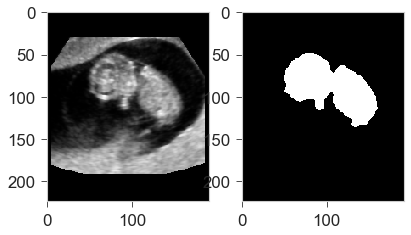

In [24]:
# check
index = 100
fig, (ax1, ax2) = plt.subplots(1, 2)
ax1.imshow(np.squeeze(X_train[index]), cmap='gray')
ax2.imshow(np.squeeze(Y_train[index]), cmap='gray')
plt.show()

# The model

### Import the dependencies

In [53]:
# https://medium.com/@pallawi.ds/semantic-segmentation-with-u-net-train-and-test-on-your-custom-data-in-keras-39e4f972ec89
import os
import sys
import random
import warnings
import numpy as np
import pandas as pd
import matplotlib
matplotlib.use('agg')
import matplotlib.pyplot as plt
from tqdm import tqdm
from itertools import chain
from skimage.io import imread, imshow, imread_collection, concatenate_images
from skimage.transform import resize
from skimage.morphology import label
from keras.models import Model, load_model
from keras.layers import Input
from keras.layers.core import Dropout, Lambda
from keras.layers.convolutional import Conv2D, Conv2DTranspose
from keras.layers.pooling import MaxPooling2D
from keras.layers.merge import concatenate
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import backend as K
import tensorflow as tf

In [26]:
# Dependencies
IMG_WIDTH = img_width
IMG_HEIGHT = img_height
IMG_CHANNELS = 1 #grayscale image (otherwise 3 for RGB image)

# example
print('The train images and masks: ')
print("X_train",X_train.shape)
print("Y_train",Y_train.shape)
print("X_test",X_test.shape)
print("Y_test",Y_test.shape)

The train images and masks: 
X_train (2303, 224, 192, 1)
Y_train (2303, 224, 192, 1)
X_test (735, 224, 192, 1)
Y_test (735, 224, 192, 1)


c:\users\rmmee\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:20: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.


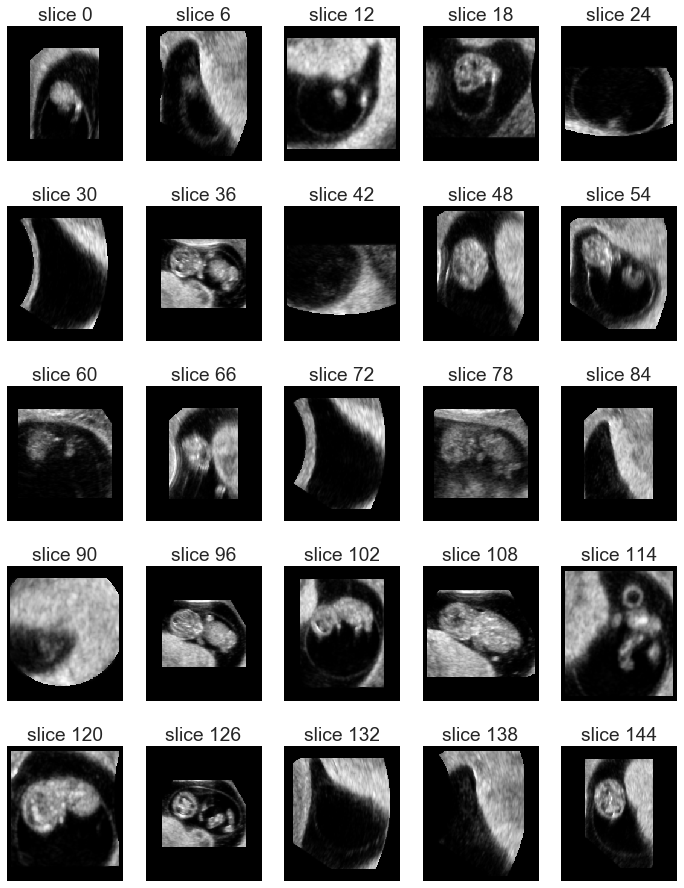

In [27]:
def sample_stack(stack, rows=8, cols=5, steps=4):
    """ Show sample slices of the stacked images. """
    fig,ax = plt.subplots(rows,cols,figsize=[12,16])
    
    show_slice = []
    for i in range(0,len(imgs_to_process), steps):
        show_slice.append(i)
    
    show_index = 0
    for i in range(rows*cols):
        if show_index == len(show_slice):
            show_index = 0         
   
        x = show_slice[show_index]
        ax[int(i/cols),int(i % cols)].set_title('slice %d' % x)
        ax[int(i/cols),int(i % cols)].imshow(stack[x], cmap='gray')
        ax[int(i/cols),int(i % cols)].axis('off')
        show_index += 1
                
    plt.show()       

imgs_to_process = np.squeeze(X_train)
sample_stack(imgs_to_process, rows=5, cols=5, steps=6)

### The metrics

In [42]:
from sklearn.metrics.pairwise import pairwise_distances

# https://drive.google.com/drive/folders/1HfUdaMsfmTpmmWHz4OlxtPcc0Sk7moEV
def mean_iou(y_true, y_pred):
    """ Mean Intersection over Union (IoU). """
    prec = []
    for t in np.arange(0.5, 1.0, 0.05):
        y_pred_ = tf.to_int32(y_pred > t)
        score, up_opt = tf.metrics.mean_iou(y_true, y_pred_, 2)
        K.get_session().run(tf.local_variables_initializer())
        with tf.control_dependencies([up_opt]):
            score = tf.identity(score)
        prec.append(score)
    return K.mean(K.stack(prec), axis=0)

# https://www.kaggle.com/c/ultrasound-nerve-segmentation/discussion/21358
def dice_coef(y_true, y_pred):
    """ Dice similarity coefficient. """
    smooth = 1.0
    y_true_f = K.batch_flatten(y_true)
    y_pred_f = K.batch_flatten(y_pred)
    intersection = 2. * K.sum(y_true_f * y_pred_f, axis=1, keepdims=True) + smooth
    union = K.sum(y_true_f, axis=1, keepdims=True) + K.sum(y_pred_f, axis=1, keepdims=True) + smooth
    return K.mean(intersection / union)

# https://datascience.stackexchange.com/questions/45165/how-to-get-accuracy-f1-precision-and-recall-for-a-keras-model
def recall_m(y_true, y_pred):
    """ Recall. """
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision_m(y_true, y_pred):
    """ Precision. """
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

# https://github.com/zhengyang-wang/3D-Unet--Tensorflow/blob/master/utils/HausdorffDistance.py
def hausdorff_distance(y_true, y_pred):
    """ Hausdorff distance. """
    y_true_f = K.batch_flatten(y_true)
    y_pred_f = K.batch_flatten(y_pred)
    d2matrix = pairwise_distances(y_true_f, y_pred_f, metric='euclidean')
    hd = tf.math.reduce_mean(tf.math.minimum(d2matrix, axis=0)) + tf.math.reduce_mean(tf.math.minimum(d2matrix, axis=1)) 
    return hd


In [44]:
import time
import keras 

class TimeHistory(keras.callbacks.Callback):
    """ Time the history of the run. """
    def on_train_begin(self, logs={}):
        self.times = []

    def on_epoch_begin(self, epoch, logs={}):
        self.epoch_time_start = time.time()

    def on_epoch_end(self, epoch, logs={}):
        self.times.append(time.time() - self.epoch_time_start)

### The U-net

In [31]:
def U_net():
    """ Build U-Net model. """
    inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    s = Lambda(lambda x: x / 255) (inputs)

    c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (s)
    c1 = Dropout(0.1) (c1)
    c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c1)
    p1 = MaxPooling2D((2, 2)) (c1)

    c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (p1)
    c2 = Dropout(0.1) (c2)
    c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c2)
    p2 = MaxPooling2D((2, 2)) (c2)

    c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (p2)
    c3 = Dropout(0.2) (c3)
    c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c3)
    p3 = MaxPooling2D((2, 2)) (c3)

    c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (p3)
    c4 = Dropout(0.2) (c4)
    c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c4)
    p4 = MaxPooling2D(pool_size=(2, 2)) (c4)

    c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (p4)
    c5 = Dropout(0.3) (c5)
    c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c5)

    u6 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same') (c5)
    u6 = concatenate([u6, c4])
    c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (u6)
    c6 = Dropout(0.2) (c6)
    c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c6)

    u7 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same') (c6)
    u7 = concatenate([u7, c3])
    c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (u7)
    c7 = Dropout(0.2) (c7)
    c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c7)

    u8 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same') (c7)
    u8 = concatenate([u8, c2])
    c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (u8)
    c8 = Dropout(0.1) (c8)
    c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c8)

    u9 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same') (c8)
    u9 = concatenate([u9, c1], axis=3)
    c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (u9)
    c9 = Dropout(0.1) (c9)
    c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c9)

    outputs = Conv2D(1, (1, 1), activation='sigmoid') (c9)

    model = Model(inputs=[inputs], outputs=[outputs])
    model.compile(optimizer='adam', 
                  loss='binary_crossentropy', 
                  metrics=['accuracy', dice_coef, mean_iou, recall_m, precision_m])
    model.summary()
    return model

# Model training

In [32]:
def save_data_pickle(PATH, data, filename):
    """ Save data in pickle file. """
    with open(PATH + '/' + filename + ".pkl","wb") as f:
        pickle.dump(data,f)
    print(filename, "created")
    

In [100]:
# Train the model
epoch = 30
modelname = 'model_unet_relu_smoothed'
input_datasets = inputdatasetspadded


def train_model(modelnumber, dataorder, random_state):
    """ Train the model. """
    # Fit model
    earlystopper = EarlyStopping(patience=10, verbose=1)
    
    # save the frames, metadata, and metric results 
    unetdata = {} 
    
    filename = modelname + str(modelnumber)
    print('run: ' + filename)
    
    # create train and test frames
    train_frames, test_frames, train_masks, test_masks, metadata = create_traintestframes(input_datasets, 
                                                                                          dataorder = dataorder, 
                                                                                          test_size=0.30, 
                                                                                          random_state=random_state)

    # split into 80% for train and 20% for validation
    # with a random state different than the previous one to make sure the data is from different datasets
    train_frames, val_frames, train_masks, val_masks = train_test_split(train_frames, train_masks, 
                                                                        test_size=0.20, random_state=int(random_state+1))
    
    # (save) the data frames
    X_train, Y_train = generator(train_frames, train_masks)
    X_val, Y_val = generator(val_frames, val_masks)
    X_test, Y_test = generator(test_frames, test_masks)
    data_frames = {'X_train': X_train, 'Y_train': Y_train,
                   'X_val': X_val, 'Y_val': Y_val, 
                   'X_test': X_test, 'Y_test': Y_test}
    
    # run the model 
    model = U_net()
    checkpoint_path = os.path.join(RESULTS_MODEL_PATH, filename)
    checkpointer = ModelCheckpoint(filepath=checkpoint_path, verbose=1, save_best_only=True)
    time_callback = TimeHistory()
    results = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), batch_size=32, epochs=epoch, 
                        callbacks=[earlystopper, checkpointer, time_callback])
    
    # save time and best value
    best = checkpointer.best
    timings = time_callback.times
    
    # save the metrics
    loss_train = results.history['loss']
    loss_val = results.history['val_loss']
    
    acc_train = results.history['acc']
    acc_val = results.history['val_acc']
    
    dice_train = results.history['dice_coef']
    dice_val = results.history['val_dice_coef']
    
    mean_iou_train = results.history['mean_iou']
    mean_iou_val = results.history['val_mean_iou']
    
    precision_train = results.history['precision_m']
    precision_val = results.history['val_precision_m']
    
    recall_train = results.history['recall_m']
    recall_val = results.history['val_recall_m']
    
    
    unetdata.update({'dataframes': data_frames, 'metadata': metadata,
                     'best': best, 'timings': timings, 
                     'loss_train': loss_train, 'loss_val':loss_val,
                     'acc_train': acc_train, 'acc_val': acc_val,
                     'dice_train': dice_train, 'dice_val': dice_val,                     
                     'mean_iou_train': mean_iou_train, 'mean_iou_val': mean_iou_val,
                     'precision_train': precision_train, 'precision_val': precision_val,
                     'recall_train': recall_train, 'recall_val': recall_val})
    
    # save from the model the data in pickle
    save_data_pickle(PATH = RESULTS_DATA_PATH, data=unetdata, filename=filename)
    print('U-net finished')
    
    # save the model 
    name = 'results_' + modelname + str(modelnumber)
    modelpath = os.path.join(RESULTS_MODEL_PATH, name)
    model.save(modelpath)
    
    return results

    
# train_model(modelnumber='1', dataorder = 'ordered', random_state=42)
# train_model(modelnumber='2', dataorder = 'ordered', random_state=43)
# train_model(modelnumber='3', dataorder = 'ordered', random_state=44)
# train_model(modelnumber='4', dataorder = 'ordered', random_state=45)
# train_model(modelnumber='5', dataorder = 'ordered', random_state=46)
# train_model(modelnumber='6', dataorder = 'ordered', random_state=47)
# train_model(modelnumber='7', dataorder = 'ordered', random_state=48)
# train_model(modelnumber='8', dataorder = 'ordered', random_state=49)
# train_model(modelnumber='9', dataorder = 'ordered', random_state=50)
# train_model(modelnumber='10', dataorder = 'ordered', random_state=51)


run: model_unet_relu_smoothed6
Dataorder:  ordered
Training datasets: ['dataset3', 'dataset1', 'dataset4', 'dataset5', 'dataset7'] contain 2256 images
Testing datasets: ['dataset6', 'dataset2'] contain 782 images
Total images:  3038
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            (None, 224, 192, 1)  0                                            
__________________________________________________________________________________________________
lambda_6 (Lambda)               (None, 224, 192, 1)  0           input_6[0][0]                    
__________________________________________________________________________________________________
conv2d_96 (Conv2D)              (None, 224, 192, 16) 160         lambda_6[0][0]                   
__________________________________________________________________________

Train on 1804 samples, validate on 452 samples
Epoch 1/30
1804/1804 [==============================] - 542s 300ms/step - loss: 0.1636 - acc: 0.9442 - dice_coef: 0.1936 - mean_iou: 0.4667 - recall_m: 0.0028 - precision_m: 0.2743 - val_loss: 0.1466 - val_acc: 0.9497 - val_dice_coef: 0.2296 - val_mean_iou: 0.4742 - val_recall_m: 2.2606e-05 - val_precision_m: 0.5375

Epoch 00001: val_loss improved from inf to 0.14663, saving model to results_unet\results_unet_model\model_unet_relu_smoothed6
Epoch 2/30
1804/1804 [==============================] - 534s 296ms/step - loss: 0.0870 - acc: 0.9483 - dice_coef: 0.3128 - mean_iou: 0.4742 - recall_m: 0.0102 - precision_m: 0.5979 - val_loss: 0.0851 - val_acc: 0.9497 - val_dice_coef: 0.3144 - val_mean_iou: 0.4744 - val_recall_m: 6.4160e-04 - val_precision_m: 0.6058

Epoch 00002: val_loss improved from 0.14663 to 0.08509, saving model to results_unet\results_unet_model\model_unet_relu_smoothed6
Epoch 3/30
1804/1804 [==============================] - 535

1804/1804 [==============================] - 534s 296ms/step - loss: 0.0065 - acc: 0.9973 - dice_coef: 0.8282 - mean_iou: 0.8600 - recall_m: 0.9728 - precision_m: 0.9740 - val_loss: 0.0076 - val_acc: 0.9970 - val_dice_coef: 0.7739 - val_mean_iou: 0.8626 - val_recall_m: 0.9842 - val_precision_m: 0.9555

Epoch 00020: val_loss improved from 0.00779 to 0.00756, saving model to results_unet\results_unet_model\model_unet_relu_smoothed6
Epoch 21/30
1804/1804 [==============================] - 532s 295ms/step - loss: 0.0063 - acc: 0.9974 - dice_coef: 0.8437 - mean_iou: 0.8651 - recall_m: 0.9734 - precision_m: 0.9754 - val_loss: 0.0083 - val_acc: 0.9967 - val_dice_coef: 0.7783 - val_mean_iou: 0.8675 - val_recall_m: 0.9901 - val_precision_m: 0.9447

Epoch 00021: val_loss did not improve from 0.00756
Epoch 22/30
1804/1804 [==============================] - 532s 295ms/step - loss: 0.0062 - acc: 0.9974 - dice_coef: 0.8583 - mean_iou: 0.8698 - recall_m: 0.9738 - precision_m: 0.9754 - val_loss: 0.007

### Show training results

In [22]:
# open pickle 
def load_data_pickle(PATH, filename):
    """ Load data from file using pickle. """
    with open(PATH + '/' + filename + ".pkl","rb") as f:
        new_data = pickle.load(f)

    print(filename, "opened")
    return new_data

In [23]:
# open the model results
modelnumbers = [1,2,4,6]
modelname = 'model_unet_relu_smoothed'
epochs = 30
modelresults = {}
 
for modelnumber in modelnumbers: 
    filename = modelname + str(modelnumber)
    modelresult = load_data_pickle(PATH= RESULTS_DATA_PATH, filename=filename)
    modelresults[filename] = modelresult
    

model_unet_relu_smoothed1 opened
model_unet_relu_smoothed2 opened
model_unet_relu_smoothed4 opened
model_unet_relu_smoothed6 opened


In [24]:
# make lists to plot results
timings = []
loss_train = []
loss_val = []
dice_train = []
dice_val = []
iou_train = []
iou_val = []
acc_train = []
acc_val = []
precision_train = []
precision_val = []
recall_train = []
recall_val = []

for key,value in modelresults.items():
    timings.append(value['timings'])
    loss_train.append(value['loss_train'])
    loss_val.append(value['loss_val'])
    dice_train.append(value['dice_train'])
    dice_val.append(value['dice_val'])
    iou_train.append(value['mean_iou_train'])
    iou_val.append(value['mean_iou_val'])
    acc_train.append(value['acc_train'])
    acc_val.append(value['acc_val'])
    precision_train.append(value['precision_train'])
    precision_val.append(value['precision_val'])
    recall_train.append(value['recall_train'])
    recall_val.append(value['recall_val'])


In [25]:
def calc_meanstd(listing):
    """ Calculate the mean and standard deviation. """
    
    # make all lists as long as the number of epochs
    for lis in listing: 
        while len(lis) != epochs: 
            lis.insert(len(lis),lis[-1])
   
    # transpose list and compute mean and std
    new_list = list(map(list, zip(*listing)))
    
    results_mean = []
    results_std = []
    for i in new_list: 
        results_mean.append(np.mean(i))
        results_std.append(np.std(i))
    
    return np.array(results_mean), np.array(results_std)


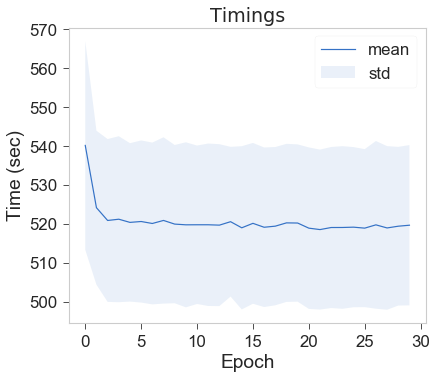

520.5435364305973

In [26]:
# Plot the results of how long the simulations took
means, stds = calc_meanstd(timings)

plt.plot(means)
plt.fill_between(range(len(means)),means-stds,means+stds,alpha=.1)
plt.title('Timings', fontname="DejaVu Sans")
plt.xlabel('Epoch')
plt.ylabel('Time (sec)')
plt.legend(['mean', 'std'], loc='best')
plt.tight_layout()
plt.savefig(RESULTS_VIS_PATH + '/' + 'unet_relu_smoothed_timings.png')
plt.show()

np.mean(means)

In [27]:
def plot_results(data_train, data_val, filename, titlename, ylabel, ylim=None, location=None):
    """ Plot the results of the metrics. """
    
    # calculate the mean and standard deviation of 
    # the training and validation set
    means_train, stds_train = calc_meanstd(data_train)
    means_val, stds_val = calc_meanstd(data_val)

    # plot the results
    plt.plot(means_train, label='train mean')
    plt.fill_between(range(len(means_train)),means_train-stds_train,means_train+stds_train,alpha=.1, label='train std')
    plt.plot(means_val, linestyle='dashed', label='validation mean', color='red')
    plt.fill_between(range(len(means_val)),means_val-stds_val,means_val+stds_val,alpha=.1, label='validation std', color='red')
    plt.title(titlename, fontname="DejaVu Sans")
    plt.xlabel('Epoch')
    plt.ylabel(ylabel)
    plt.xticks(np.linspace(0,epochs,int(epochs/5+1)))
    
    try: 
        plt.ylim(ylim[0], ylim[1])
    except:
        pass
        
    try: 
        plt.legend(loc=location)
    except: 
        plt.legend(loc='best')
        
    plt.tight_layout()
    plt.savefig(RESULTS_VIS_PATH + '/' + filename + '.png')
    plt.show()
    
    # print the final outcomes 
    print('mean: ', round(means_train[-1],3))
    print('std: ',  round(stds_train[-1],3))
    print(format(stds_train[-1], "5.2e"))
    

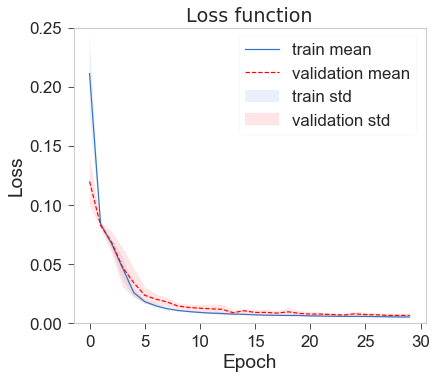

mean:  0.005
std:  0.0
3.76e-04


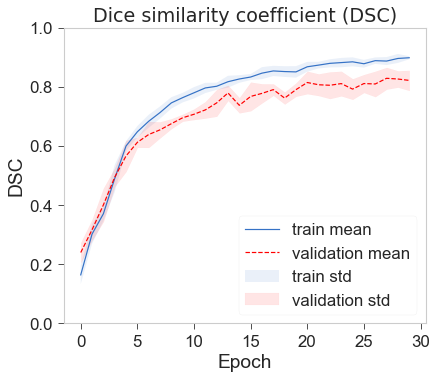

mean:  0.898
std:  0.005
5.35e-03


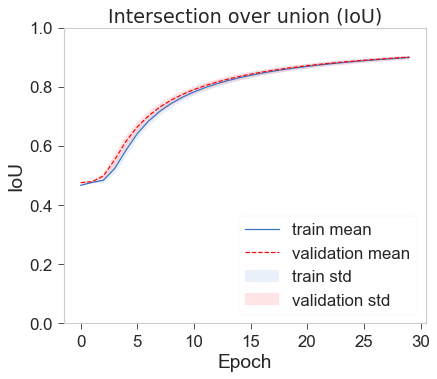

mean:  0.899
std:  0.006
5.97e-03


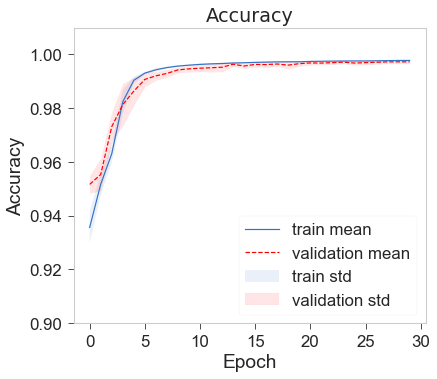

mean:  0.998
std:  0.0
1.54e-04


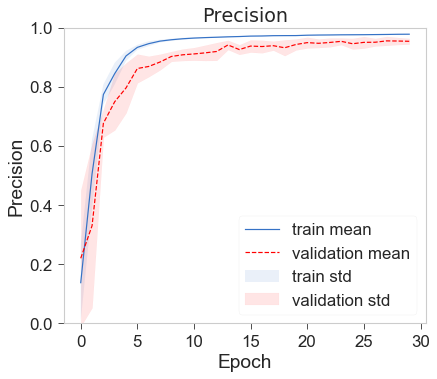

mean:  0.978
std:  0.001
9.45e-04


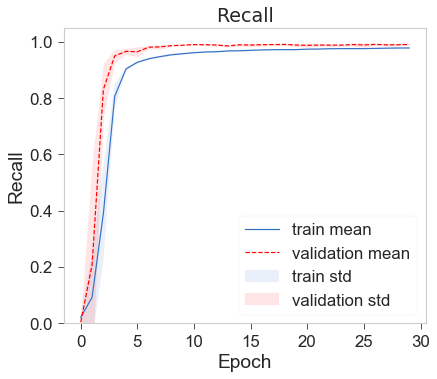

mean:  0.978
std:  0.001
1.03e-03


In [28]:
plot_results(loss_train, loss_val, filename='unet_relu_smoothed_loss', titlename='Loss function', ylabel='Loss', ylim=[0, 0.25])
plot_results(dice_train, dice_val, filename='unet_relu_smoothed_dice', titlename='Dice similarity coefficient (DSC)', ylabel='DSC', ylim=[0,1])
plot_results(iou_train, iou_val, filename='unet_relu_smoothed_iou', titlename='Intersection over union (IoU)', ylabel='IoU', ylim=[0,1], location='lower right')
plot_results(acc_train, acc_val, filename='unet_relu_smoothed_acc', titlename='Accuracy', ylabel='Accuracy', ylim=[0.90, 1.010], location='lower right')
plot_results(precision_train, precision_val, filename='unet_relu_smoothed_precision', titlename='Precision', ylabel='Precision', ylim=[0,1], location='lower right')
plot_results(recall_train, recall_val, filename='unet_relu_smoothed_recall', titlename='Recall', ylabel='Recall', ylim=[0,1.05], location='lower right')

# Model testing

### Load data

In [5]:
modelnumbers = [1,2,4,6]
modelname = 'model_unet_relu_smoothed'
modelpaths = []

for modelnumber in modelnumbers: 
    filename = modelname + str(modelnumber)
    modelpaths.append(filename)
    
print(modelpaths)


['model_unet_relu_smoothed1', 'model_unet_relu_smoothed2', 'model_unet_relu_smoothed4', 'model_unet_relu_smoothed6']


In [126]:
data = {}

for modelterm in tqdm(modelpaths): 
    time.sleep(0.1)
    
    # get for each model the full filepath and load the model
    filepath = os.path.join(RESULTS_MODEL_PATH, modelterm)
    model = load_model(filepath, custom_objects={'dice_coef': dice_coef,'mean_iou': mean_iou, 
                                                 'recall_m': recall_m, 'precision_m': precision_m})

    # load the frames 
    X_train = modelresults[modelterm]['dataframes']['X_train']
    Y_train = modelresults[modelterm]['dataframes']['Y_train']
    X_val = modelresults[modelterm]['dataframes']['X_val']
    Y_val = modelresults[modelterm]['dataframes']['Y_val']
    X_test = modelresults[modelterm]['dataframes']['X_test']
    Y_test = modelresults[modelterm]['dataframes']['Y_test']
    
    # get the predictions of the training, validation, and test set
    preds_train = model.predict(X_train, verbose=1)
    preds_val = model.predict(X_val, verbose=1)
    preds_test = model.predict(X_test, verbose=1)
    
    # threshold predicted images 
    # to make sure the predicted images are binary
    preds_train_t = (preds_train > 0.5).astype(np.uint8)
    preds_val_t = (preds_val > 0.5).astype(np.uint8)
    preds_test_t = (preds_test > 0.5).astype(np.uint8)
    
    # evaluate on the test data 
    results_train = model.evaluate(X_train, Y_train, batch_size=32)
    results_val = model.evaluate(X_val, Y_val, batch_size=32)
    results_test = model.evaluate(X_test, Y_test, batch_size=32)
    
    # save the data in the dictionary
    data.update({modelterm: {'preds_train_t': preds_train_t, 'preds_val_t': preds_val_t, 'preds_test_t': preds_test_t,
                             'X_train': X_train, 'Y_train': Y_train, 
                             'X_val': X_val, 'Y_val': Y_val,
                             'X_test': X_test, 'Y_test': Y_test,
                             'results_train': results_train, 'results_val': results_val, 'results_test': results_test}})


  0%|                                                                                            | 0/4 [00:00<?, ?it/s]

735/735 [==============================] - 64s 88ms/step


 25%|████████████████████▊                                                              | 1/4 [08:38<25:54, 518.29s/it]

958/958 [==============================] - 83s 87ms/step


 50%|█████████████████████████████████████████▌                                         | 2/4 [17:19<17:18, 519.29s/it]

881/881 [==============================] - 77s 87ms/step


 75%|██████████████████████████████████████████████████████████████▎                    | 3/4 [26:04<08:40, 520.99s/it]

782/782 [==============================] - 68s 87ms/step


100%|███████████████████████████████████████████████████████████████████████████████████| 4/4 [34:53<00:00, 523.34s/it]


In [124]:
def save_data_pickle(PATH, data, filename):
    """ Save data in pickle file. """
    with open(PATH + '/' + filename + ".pkl","wb") as f:
        pickle.dump(data,f)
    print(filename, "created")
    

In [127]:
# save (to be sure) the data in a dictionary 
save_data_pickle(PATH = RESULTS_DATA_PATH, data=data, filename='data_unet_relu_smoothed') 

data_unet_relu_smoothed created


### Statistic results

In [5]:
# open pickle 
def load_data_pickle(PATH, filename):
    """ Load data from file using pickle. """
    with open(PATH + '/' + filename + ".pkl","rb") as f:
        new_data = pickle.load(f)

    print(filename, "opened")
    return new_data

In [6]:
dataresults = load_data_pickle(PATH= RESULTS_DATA_PATH, filename='data_unet_relu_smoothed')

data_unet_relu_smoothed opened


In [7]:
def calc_dice_coef(y_true, y_pred): 
    """ Calculate the dice similarity coefficient. """
    smooth = 1.0
    y_true_f = y_true.flatten()
    y_pred_f = y_pred.flatten()
    intersection = 2. * np.sum(y_true_f * y_pred_f) + smooth
    union = np.sum(y_true_f) + np.sum(y_pred_f) + smooth
    dice = intersection/union
    return dice

def calc_iou(y_true, y_pred):
    """ Calculate the Intersection over Union (IoU). """
    smooth = np.finfo(float).eps
    intersection = np.logical_and(y_true, y_pred) 
    union = np.logical_or(y_true, y_pred) 
    iou_score = np.sum(intersection + smooth) / np.sum(union + smooth)
    return iou_score


In [8]:
def calculate_statistics(data, name='test'):
    results_dice = []
    results_iou = []

    for modelkey, modelvalues in tqdm(data.items()): 
        time.sleep(0.1)

        # save results per modelkey
        result_dice = []
        result_iou = []

        # calculate the metrics
        for key, image in enumerate(modelvalues['Y_' + name]):
            dice = calc_dice_coef(image, modelvalues['preds_' +  name + '_t'][key])
            iou = calc_iou(image, modelvalues['preds_' +  name + '_t'][key])
           
            result_dice.append(dice)
            result_iou.append(iou)
          
        # add the mean of each metric to the final results     
        results_dice.append(np.mean(result_dice))
        results_iou.append(np.mean(result_iou))

    print('The mean and standard deviation of: ' + name)
    print('DSC', round(np.mean(results_dice),3), round(np.std(results_dice),3))
    print('IoU', round(np.mean(results_iou),3), round(np.std(results_iou),3))
    results = {'DSC': results_dice, 'IoU': results_iou}
    return results

results = calculate_statistics(dataresults, name='test')

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:01<00:00,  2.33it/s]

The mean and standard deviation of: test
DSC 0.735 0.033
IoU 0.673 0.035


### Show prediction

In [9]:
dataresults.keys()

dict_keys(['model_unet_relu_smoothed1', 'model_unet_relu_smoothed2', 'model_unet_relu_smoothed4', 'model_unet_relu_smoothed6'])

In [10]:
# show model
from_model = dataresults['model_unet_relu_smoothed6']

# training frames
X_train = from_model['X_train']
Y_train = from_model['Y_train']
preds_train_t = from_model['preds_train_t']

# test frames
X_test = from_model['X_test']
Y_test = from_model['Y_test']
preds_test_t = from_model['preds_test_t']

In [11]:
def create_colors(frame_gt, frame_prediction):
    """ Create colored predicted image by comparing the prediction
    to the ground truth. True negatives are black, true positives are white,
    false positives are green, and false negatives are red. """
    
    frame_result = np.zeros((frame_prediction.shape[0],frame_prediction.shape[1], 
                             frame_prediction.shape[2] ,3), dtype=np.uint8) # black: true negatives
    frame_result[frame_prediction == 1] = [255, 255, 255] # white: true positives

    frame_result[(frame_prediction == 1) & (frame_gt == 0)] = [0, 255, 0] # green: false positives
    frame_result[(frame_prediction == 0) & (frame_gt == 1)] = [255, 0, 0] # red: false negatives

    return frame_result


def generate_colorimage(predicted_datasets, gt_datasets):
    """ Generate the colored predicted image. """
    
    predict_color = []
    predictions = np.squeeze(predicted_datasets)
    groundtruths = np.squeeze(gt_datasets)
 
    # compare the predicted images to the ground truth 
    for predicted_key, predicted_image in enumerate(predicted_datasets):
        image = create_colors(gt_datasets[predicted_key], predicted_image)
        predict_color.append(image)
 
    return np.array(predict_color)


In [12]:
preds_train_color = generate_colorimage(preds_train_t, Y_train)
preds_test_color = generate_colorimage(preds_test_t, Y_test)

In [13]:
# show an amount of images
def show_images(original, groundtruth, prediction, n_rows = 10, starting = 0): 
    """ Show the images. """
    columns = 3 
    rows = n_rows 
 
    fig,ax = plt.subplots(rows,columns,figsize=[15,rows*3])
    ax[0,0].set_title('Input frame')
    ax[0,1].set_title('Ground truth mask')
    ax[0,2].set_title('Predicted mask')
    
    # axes are in a two-dimensional array, indexed by [row, col]
    for i in range(starting, rows): 
        ax[i,0].imshow(np.squeeze(original[i]), cmap='gray') 
        ax[i,1].imshow(np.squeeze(groundtruth[i]), cmap='gray')
        ax[i,2].imshow(np.squeeze(prediction[i]), cmap='gray')
        
        index = list(range(n_rows)) 
        ax[i,0].set_ylabel(str(index[i]) + '      ', rotation=0)
        
        for j in range(columns):
            ax[i,j].set_yticks([])
            ax[i,j].set_xticks([])
        
    plt.show()


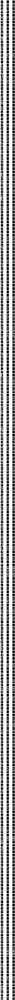

In [14]:
# show training images 
show_images(X_train, Y_train, preds_train_color, n_rows=300) #n_rows=len(preds_train_color)

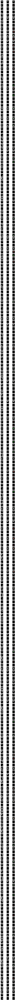

In [15]:
# show test images
show_images(X_test, Y_test, preds_test_color, n_rows=300) #n_rows=len(preds_test_color)

### show specific images

In [16]:
import string

def show_specific_images(original, groundtruth, prediction, indexlist, filename, letter=None): 
    """ Show specific images based on their index. 
        Note: you need to include at least two indices. """
    columns = 3 
    rows = len(indexlist) 
 
    fig,ax = plt.subplots(rows,columns,figsize=[10,rows*3])
    ax[0,0].set_title('Input frame')
    ax[0,1].set_title('Ground truth mask')
    ax[0,2].set_title('Predicted mask')
    
    
    # axes are in a two-dimensional array, indexed by [row, col]
    for i, index in enumerate(indexlist): 
        # images 
        ax[i,0].imshow(np.squeeze(original[index]), cmap='gray') 
        ax[i,1].imshow(np.squeeze(groundtruth[index]), cmap='gray')
        ax[i,2].imshow(np.squeeze(prediction[index]), cmap='gray')
        
        # labels
        letters = list(string.ascii_uppercase)
        try: 
            ax[i,0].set_ylabel(str(letters[letter+i]) + '      ', rotation=0)
        except: 
            ax[i,0].set_ylabel(str(letters[i]) + '      ', rotation=0)
            
        for j in range(columns):
            ax[i,j].set_yticks([])
            ax[i,j].set_xticks([])
            
        plt.tight_layout()
        plt.savefig(RESULTS_IMG_PATH + '/' + filename + '.png')

    plt.show()

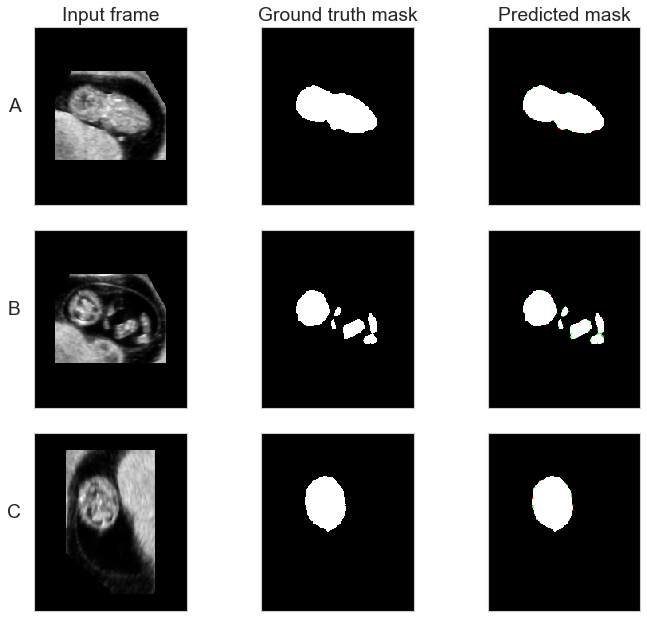

In [17]:
# show specific test images 
show_specific_images(X_test, Y_test, preds_test_color, indexlist = [103,27,44], 
                     filename = 'relu_smoothed_test_good')


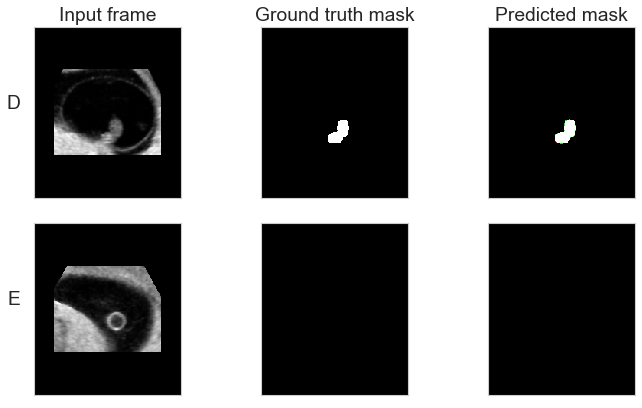

In [18]:
# show specific test images 
show_specific_images(X_test, Y_test, preds_test_color, indexlist = [99, 54], 
                     filename = 'relu_smoothed_test_good2', letter=3)



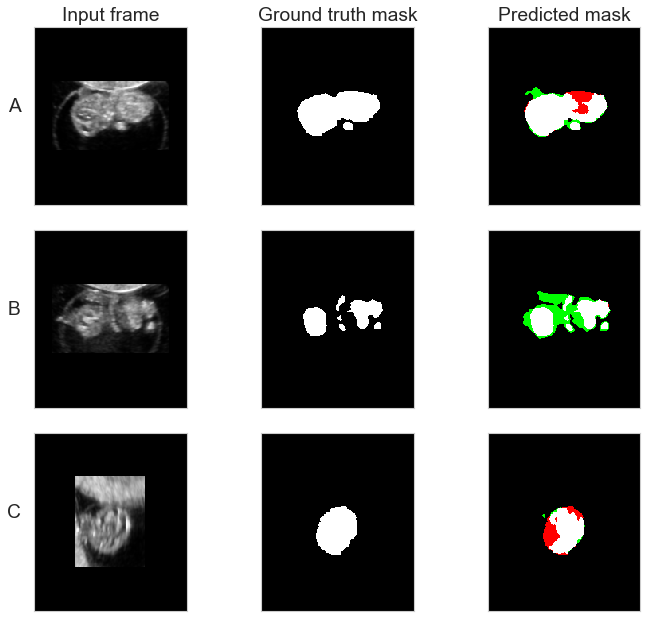

In [19]:
show_specific_images(X_test, Y_test, preds_test_color, indexlist = [93, 128, 20], filename = 'relu_smoothed_test_bad')

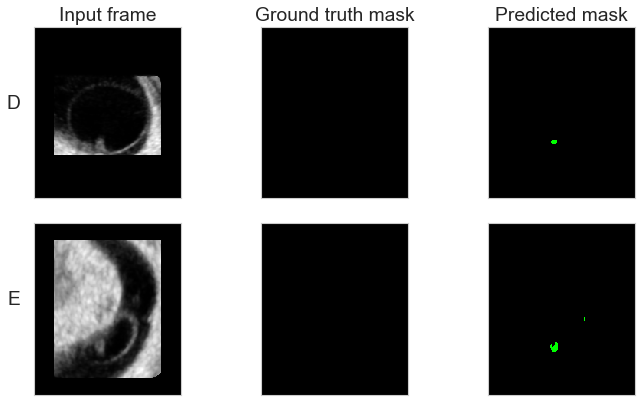

In [20]:
show_specific_images(X_test, Y_test, preds_test_color, indexlist = [134, 249], filename = 'relu_smoothed_test_bad2', letter=3)

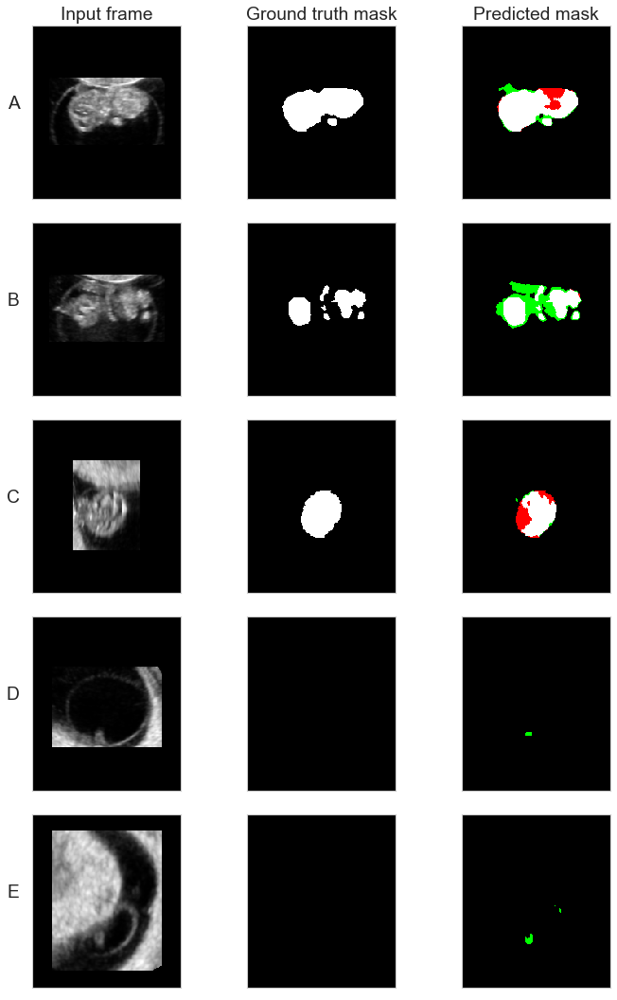

In [21]:
show_specific_images(X_test, Y_test, preds_test_color, indexlist = [93, 128, 20, 134, 249], filename = 'relu_smoothed_test_bad3')